# BreastPathQ: Cuantificación de Celularidad Tumoral
## Proyecto Final - Introducción a los Sistemas Inteligentes

**Objetivo:** Desarrollar un modelo de aprendizaje profundo para predecir automáticamente la celularidad tumoral en imágenes de histopatología de cáncer de mama.

**Equipo:** [Nombres de los integrantes]

**Fecha:** Diciembre 2025

---

## Tabla de Contenidos
- A. Descripción del problema
- B. Importación de datos
- C. Exploración de datos
- D. Modelos y ajuste de hiperparámetros
- E. Evaluación del desempeño
- F. Conclusiones y resultados
- G. Generación del archivo de envío

# A. Descripción del Problema

## Contexto Médico

El **BreastPathQ Challenge** aborda un problema fundamental en el diagnóstico y tratamiento del cáncer de mama: la **cuantificación de la celularidad tumoral**. 

### ¿Qué es la celularidad tumoral?

La **celularidad tumoral** (o tumor cellularity) es el **porcentaje de células cancerosas** presentes en una muestra de tejido tumoral. Es un biomarcador crítico que:

1. **Guía decisiones terapéuticas**: Determina la agresividad del tratamiento
2. **Predice respuesta**: Indica cómo responderá el paciente a terapias neoadyuvantes
3. **Evalúa pronóstico**: Ayuda a estimar el curso de la enfermedad

### Problema Técnico

Tradicionalmente, los patólogos evalúan manualmente la celularidad observando muestras de tejido teñidas con **Hematoxilina y Eosina (H&E)** bajo el microscopio. Este proceso:
- ❌ Es subjetivo y variable entre patólogos
- ❌ Consume mucho tiempo
- ❌ Puede tener inconsistencias

### Formulación como Problema de Machine Learning

**Tipo de problema:** Regresión supervisada

**Input (X):** Imágenes de parches histológicos (patches) de 512x512 píxeles extraídos de WSI (Whole Slide Images)

**Output (y):** Valor continuo entre 0 y 1 que representa el score de celularidad:
- `0.0` = 0% de células tumorales (todo tejido normal/estroma)
- `1.0` = 100% de células tumorales

**Objetivo:** Entrenar un modelo que aprenda a mapear características visuales de las imágenes H&E a un score de celularidad preciso.

### Dataset

- **Entrenamiento:** 2,396 parches con etiquetas de celularidad asignadas por patólogos expertos
- **Validación:** 187 parches con etiquetas
- **Test:** 1,121 parches sin etiquetas (para evaluación en competencia)
- **Origen:** Sunnybrook Health Sciences Centre, Toronto
- **Pacientes:** 64 pacientes con cáncer de mama invasivo tras terapia neoadyuvante
- **Magnificación:** 20X

### Métrica de Evaluación: PK (Pearson Correlation)

La métrica **PK** es el **coeficiente de correlación de Pearson** entre las predicciones y los valores reales. Mide qué tan bien las predicciones siguen la tendencia lineal de los valores verdaderos:

$$PK = \frac{\sum_{i=1}^{n}(y_i - \bar{y})(\hat{y}_i - \bar{\hat{y}})}{\sqrt{\sum_{i=1}^{n}(y_i - \bar{y})^2}\sqrt{\sum_{i=1}^{n}(\hat{y}_i - \bar{\hat{y}})^2}}$$

Donde:
- $y_i$ = valor real de celularidad
- $\hat{y}_i$ = predicción del modelo
- $\bar{y}$ = media de valores reales
- $\bar{\hat{y}}$ = media de predicciones

**Interpretación:**
- PK = 1.0: Correlación perfecta positiva
- PK = 0.7: Correlación fuerte (meta mínima del proyecto)
- PK = 0.0: No hay correlación
- PK < 0: Correlación negativa

**Meta del proyecto:** PK ≥ 0.7

# B. Importación de Datos

En esta sección importamos las bibliotecas necesarias y cargamos los datos del desafío BreastPathQ.

In [2]:
# Importar bibliotecas estándar
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Importar bibliotecas para procesamiento de imágenes
from PIL import Image
import cv2

# Importar TensorFlow y Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization

# Importar métricas
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import pearsonr

# Configurar semilla para reproducibilidad
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Configurar visualización
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU disponible: {tf.config.list_physical_devices('GPU')}")
print("✓ Bibliotecas importadas correctamente")

TensorFlow version: 2.20.0
GPU disponible: []
✓ Bibliotecas importadas correctamente


## Configuración de rutas y carga de datos

In [3]:
# Definir rutas a los datos
BASE_DIR = Path(r'c:\Users\Usuario\OneDrive\Escritorio\Proyecto')
TRAIN_DIR = BASE_DIR / 'breastpathq' / 'datasets' / 'train'
VAL_DIR = BASE_DIR / 'breastpathq' / 'datasets' / 'validation'
TEST_DIR = BASE_DIR / 'breastpathq-test' / 'test_patches'

TRAIN_LABELS_PATH = BASE_DIR / 'breastpathq' / 'datasets' / 'train_labels.csv'
VAL_LABELS_PATH = BASE_DIR / 'breastpathq-test' / 'val_labels.csv'

# Verificar que las rutas existan
print("Verificando rutas de datos...")
print(f"Directorio de entrenamiento: {TRAIN_DIR.exists()}")
print(f"Directorio de validación: {VAL_DIR.exists()}")
print(f"Directorio de test: {TEST_DIR.exists()}")
print(f"Archivo de etiquetas de entrenamiento: {TRAIN_LABELS_PATH.exists()}")
print(f"Archivo de etiquetas de validación: {VAL_LABELS_PATH.exists()}")

# Cargar etiquetas
train_labels = pd.read_csv(TRAIN_LABELS_PATH)
val_labels = pd.read_csv(VAL_LABELS_PATH)

print(f"\n✓ Datos de entrenamiento: {len(train_labels)} muestras")
print(f"✓ Datos de validación: {len(val_labels)} muestras")
print("\nPrimeras filas de train_labels:")
print(train_labels.head(10))

Verificando rutas de datos...
Directorio de entrenamiento: True
Directorio de validación: True
Directorio de test: True
Archivo de etiquetas de entrenamiento: True
Archivo de etiquetas de validación: True

✓ Datos de entrenamiento: 2394 muestras
✓ Datos de validación: 185 muestras

Primeras filas de train_labels:
   slide  rid     y
0  99861    1  0.40
1  99861    2  0.40
2  99861    3  0.15
3  99861    4  0.10
4  99861    5  0.07
5  99861    6  0.05
6  99861    7  0.08
7  99861    8  0.15
8  99861    9  0.15
9  99861   10  0.20


In [4]:
# Crear columnas de rutas de archivos completas
train_labels['filename'] = train_labels['slide'].astype(str) + '_' + train_labels['rid'].astype(str) + '.tif'
train_labels['filepath'] = train_labels['filename'].apply(lambda x: str(TRAIN_DIR / x))

val_labels['filename'] = val_labels['slide'].astype(str) + '_' + val_labels['rid'].astype(str) + '.tif'
val_labels['filepath'] = val_labels['filename'].apply(lambda x: str(VAL_DIR / x))

# Verificar que los archivos existan
train_labels['exists'] = train_labels['filepath'].apply(os.path.exists)
val_labels['exists'] = val_labels['filepath'].apply(os.path.exists)

print(f"Archivos de entrenamiento existentes: {train_labels['exists'].sum()}/{len(train_labels)}")
print(f"Archivos de validación existentes: {val_labels['exists'].sum()}/{len(val_labels)}")

# Filtrar solo archivos que existen
train_labels = train_labels[train_labels['exists']].reset_index(drop=True)
val_labels = val_labels[val_labels['exists']].reset_index(drop=True)

print(f"\n✓ Dataset de entrenamiento final: {len(train_labels)} imágenes")
print(f"✓ Dataset de validación final: {len(val_labels)} imágenes")

Archivos de entrenamiento existentes: 2394/2394
Archivos de validación existentes: 185/185

✓ Dataset de entrenamiento final: 2394 imágenes
✓ Dataset de validación final: 185 imágenes


# C. Exploración de Datos

Analizaremos la distribución de los datos y visualizaremos algunas imágenes de muestra.

In [5]:
# Estadísticas descriptivas
print("=" * 60)
print("ESTADÍSTICAS DE CELULARIDAD - CONJUNTO DE ENTRENAMIENTO")
print("=" * 60)
print(train_labels['y'].describe())
print(f"\nRango: [{train_labels['y'].min():.3f}, {train_labels['y'].max():.3f}]")
print(f"Media: {train_labels['y'].mean():.3f}")
print(f"Mediana: {train_labels['y'].median():.3f}")
print(f"Desviación estándar: {train_labels['y'].std():.3f}")

print("\n" + "=" * 60)
print("ESTADÍSTICAS DE CELULARIDAD - CONJUNTO DE VALIDACIÓN")
print("=" * 60)
print(val_labels['y'].describe())
print(f"\nRango: [{val_labels['y'].min():.3f}, {val_labels['y'].max():.3f}]")
print(f"Media: {val_labels['y'].mean():.3f}")
print(f"Mediana: {val_labels['y'].median():.3f}")
print(f"Desviación estándar: {val_labels['y'].std():.3f}")

# Información sobre slides únicos
print("\n" + "=" * 60)
print("INFORMACIÓN DE SLIDES")
print("=" * 60)
print(f"Slides únicos en entrenamiento: {train_labels['slide'].nunique()}")
print(f"Slides únicos en validación: {val_labels['slide'].nunique()}")

ESTADÍSTICAS DE CELULARIDAD - CONJUNTO DE ENTRENAMIENTO
count    2394.000000
mean        0.312018
std         0.320758
min         0.000000
25%         0.000000
50%         0.200000
75%         0.500000
max         1.000000
Name: y, dtype: float64

Rango: [0.000, 1.000]
Media: 0.312
Mediana: 0.200
Desviación estándar: 0.321

ESTADÍSTICAS DE CELULARIDAD - CONJUNTO DE VALIDACIÓN
count    185.000000
mean       0.341838
std        0.295502
min        0.000000
25%        0.070000
50%        0.250000
75%        0.600000
max        1.000000
Name: y, dtype: float64

Rango: [0.000, 1.000]
Media: 0.342
Mediana: 0.250
Desviación estándar: 0.296

INFORMACIÓN DE SLIDES
Slides únicos en entrenamiento: 63
Slides únicos en validación: 6


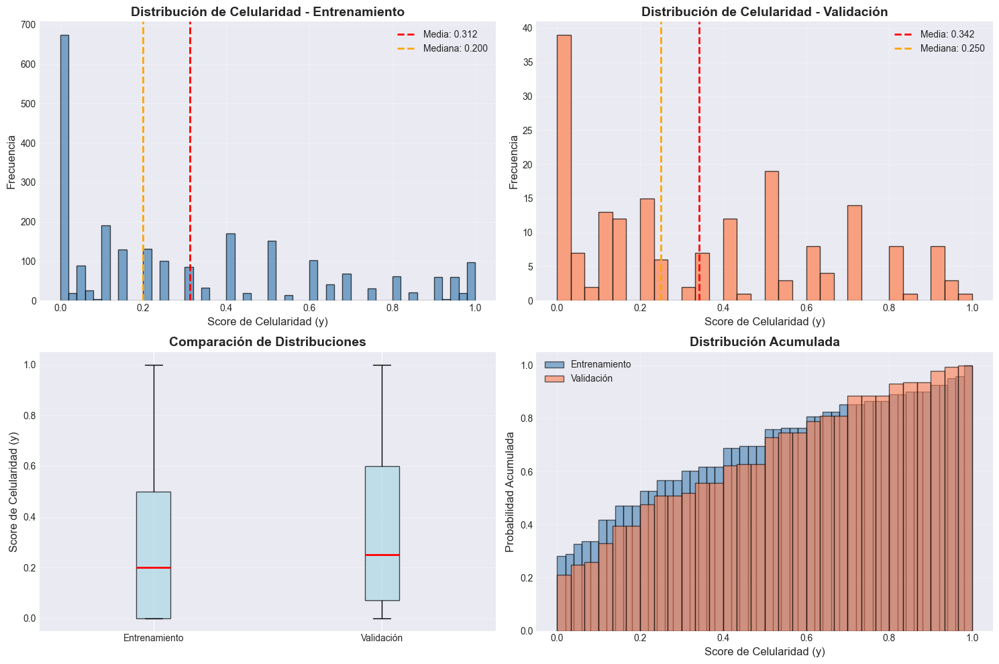


✓ Gráficas de distribución generadas


In [6]:
# Visualización de distribuciones
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Histograma de entrenamiento
axes[0, 0].hist(train_labels['y'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
axes[0, 0].set_title('Distribución de Celularidad - Entrenamiento', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Score de Celularidad (y)', fontsize=12)
axes[0, 0].set_ylabel('Frecuencia', fontsize=12)
axes[0, 0].axvline(train_labels['y'].mean(), color='red', linestyle='--', linewidth=2, label=f'Media: {train_labels["y"].mean():.3f}')
axes[0, 0].axvline(train_labels['y'].median(), color='orange', linestyle='--', linewidth=2, label=f'Mediana: {train_labels["y"].median():.3f}')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Histograma de validación
axes[0, 1].hist(val_labels['y'], bins=30, color='coral', edgecolor='black', alpha=0.7)
axes[0, 1].set_title('Distribución de Celularidad - Validación', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Score de Celularidad (y)', fontsize=12)
axes[0, 1].set_ylabel('Frecuencia', fontsize=12)
axes[0, 1].axvline(val_labels['y'].mean(), color='red', linestyle='--', linewidth=2, label=f'Media: {val_labels["y"].mean():.3f}')
axes[0, 1].axvline(val_labels['y'].median(), color='orange', linestyle='--', linewidth=2, label=f'Mediana: {val_labels["y"].median():.3f}')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Boxplot comparativo
data_to_plot = [train_labels['y'], val_labels['y']]
axes[1, 0].boxplot(data_to_plot, labels=['Entrenamiento', 'Validación'], patch_artist=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.7),
                    medianprops=dict(color='red', linewidth=2))
axes[1, 0].set_title('Comparación de Distribuciones', fontsize=14, fontweight='bold')
axes[1, 0].set_ylabel('Score de Celularidad (y)', fontsize=12)
axes[1, 0].grid(True, alpha=0.3, axis='y')

# Distribución acumulada
axes[1, 1].hist(train_labels['y'], bins=50, cumulative=True, density=True, 
                color='steelblue', alpha=0.6, label='Entrenamiento', edgecolor='black')
axes[1, 1].hist(val_labels['y'], bins=30, cumulative=True, density=True, 
                color='coral', alpha=0.6, label='Validación', edgecolor='black')
axes[1, 1].set_title('Distribución Acumulada', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Score de Celularidad (y)', fontsize=12)
axes[1, 1].set_ylabel('Probabilidad Acumulada', fontsize=12)
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Gráficas de distribución generadas")

Visualizando muestras del conjunto de entrenamiento...


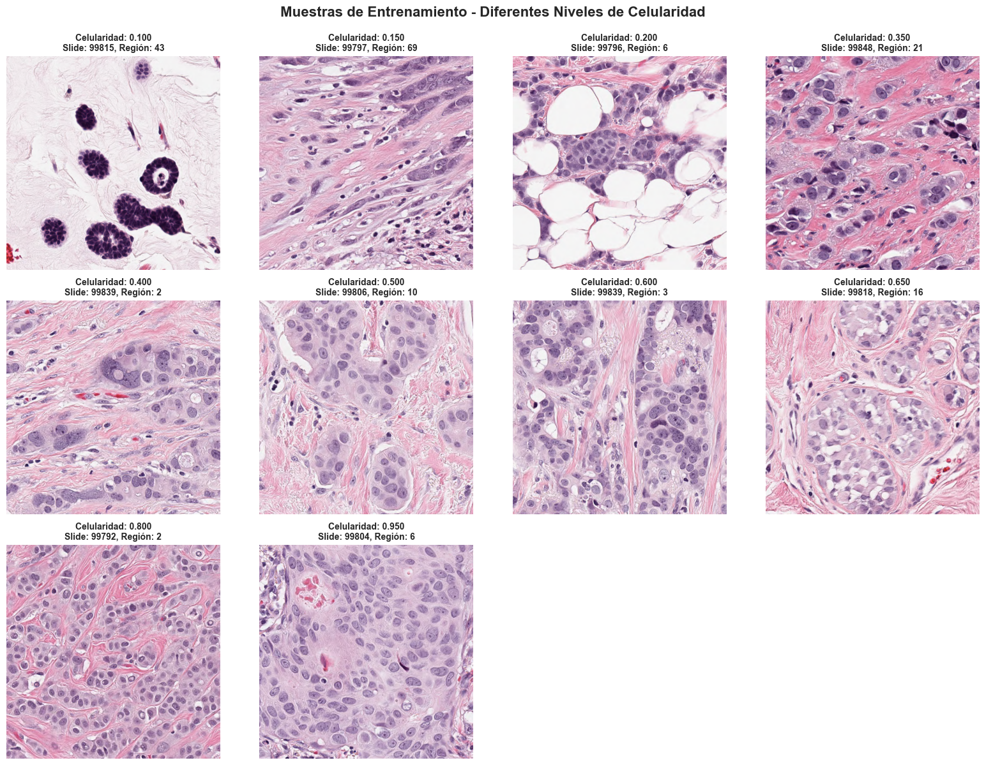

In [7]:
# Visualizar muestras de imágenes con diferentes niveles de celularidad
def visualize_samples(df, n_samples=12, title="Muestras de Imágenes"):
    """Visualiza muestras de imágenes ordenadas por score de celularidad"""
    # Seleccionar muestras de diferentes rangos de celularidad
    bins = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
    samples_per_bin = n_samples // len(bins)
    
    selected_samples = []
    for i in range(len(bins)-1):
        bin_data = df[(df['y'] >= bins[i]) & (df['y'] < bins[i+1])]
        if len(bin_data) > 0:
            selected_samples.append(bin_data.sample(min(samples_per_bin, len(bin_data))))
    
    samples_df = pd.concat(selected_samples).sort_values('y').head(n_samples)
    
    # Crear visualización
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    axes = axes.flatten()
    
    for idx, (_, row) in enumerate(samples_df.iterrows()):
        if idx >= n_samples:
            break
            
        img = Image.open(row['filepath'])
        axes[idx].imshow(img)
        axes[idx].set_title(f"Celularidad: {row['y']:.3f}\nSlide: {row['slide']}, Región: {row['rid']}", 
                           fontsize=10, fontweight='bold')
        axes[idx].axis('off')
    
    # Ocultar ejes sobrantes
    for idx in range(len(samples_df), n_samples):
        axes[idx].axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

print("Visualizando muestras del conjunto de entrenamiento...")
visualize_samples(train_labels, n_samples=12, title="Muestras de Entrenamiento - Diferentes Niveles de Celularidad")

In [8]:
# Analizar dimensiones de las imágenes
sample_img = Image.open(train_labels.iloc[0]['filepath'])
print(f"Dimensiones de una imagen de muestra: {sample_img.size}")
print(f"Modo de color: {sample_img.mode}")
print(f"Información: {sample_img.info if hasattr(sample_img, 'info') else 'N/A'}")

# Verificar si todas las imágenes tienen el mismo tamaño
print("\nVerificando tamaños de imágenes (primeras 100)...")
sizes = []
for filepath in train_labels['filepath'].head(100):
    img = Image.open(filepath)
    sizes.append(img.size)
    img.close()

unique_sizes = set(sizes)
print(f"Tamaños únicos encontrados: {unique_sizes}")
if len(unique_sizes) == 1:
    print("✓ Todas las imágenes tienen el mismo tamaño")
else:
    print("⚠ Las imágenes tienen tamaños diferentes")

Dimensiones de una imagen de muestra: (512, 512)
Modo de color: RGB
Información: {'compression': 'raw', 'dpi': (1, 1), 'resolution': (1, 1)}

Verificando tamaños de imágenes (primeras 100)...
Tamaños únicos encontrados: {(512, 512)}
✓ Todas las imágenes tienen el mismo tamaño
Tamaños únicos encontrados: {(512, 512)}
✓ Todas las imágenes tienen el mismo tamaño


# D. Modelos y Ajuste de Hiperparámetros

## Estrategia de Modelado

Utilizaremos **Transfer Learning con ResNet50**, un enfoque probado para análisis de imágenes médicas:

### Arquitectura del Modelo

1. **Base:** ResNet50 pre-entrenado en ImageNet (pesos iniciales optimizados)
2. **Congelamiento:** Capas iniciales congeladas (extracción de características generales)
3. **Fine-tuning:** Capas superiores entrenables (adaptación a histopatología)
4. **Cabeza de regresión:** Capas densas personalizadas para predecir celularidad

### Hiperparámetros Clave

- **Tamaño de imagen:** 224x224 (estándar para ResNet50)
- **Batch size:** 32
- **Learning rate:** 0.0001 (Adam optimizer)
- **Épocas:** Hasta 50 con Early Stopping
- **Data Augmentation:** Rotaciones, flips, zoom (aumentar variabilidad)

### Data Augmentation

Para mejorar la generalización y evitar overfitting, aplicaremos transformaciones realistas:
- Rotaciones aleatorias (±20°)
- Flips horizontal y vertical
- Zoom aleatorio (±10%)
- Ajustes de brillo (±20%)

In [10]:
# Configuración de hiperparámetros
IMG_SIZE = 224  # Tamaño de entrada para ResNet50
BATCH_SIZE = 32
EPOCHS = 50  # Aumentado para mejor convergencia
LEARNING_RATE = 0.00005  # Reducido para entrenamiento más estable

print("=" * 60)
print("CONFIGURACIÓN DE HIPERPARÁMETROS")
print("=" * 60)
print(f"Tamaño de imagen: {IMG_SIZE}x{IMG_SIZE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Épocas máximas: {EPOCHS}")
print(f"Learning rate: {LEARNING_RATE}")
print(f"Optimizer: Adam")
print(f"Loss function: Mean Squared Error (MSE)")
print("=" * 60)

CONFIGURACIÓN DE HIPERPARÁMETROS
Tamaño de imagen: 224x224
Batch size: 32
Épocas máximas: 50
Learning rate: 5e-05
Optimizer: Adam
Loss function: Mean Squared Error (MSE)


In [11]:
# Generadores de datos con Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,              # Normalizar píxeles a [0, 1]
    rotation_range=20,           # Rotación aleatoria ±20°
    width_shift_range=0.1,       # Desplazamiento horizontal ±10%
    height_shift_range=0.1,      # Desplazamiento vertical ±10%
    horizontal_flip=True,        # Flip horizontal aleatorio
    vertical_flip=True,          # Flip vertical aleatorio
    zoom_range=0.1,              # Zoom aleatorio ±10%
    brightness_range=[0.8, 1.2], # Ajuste de brillo ±20%
    fill_mode='reflect'          # Rellenar píxeles vacíos por reflexión
)

# Generador de validación (solo normalización, sin augmentation)
val_datagen = ImageDataGenerator(
    rescale=1./255
)

print("✓ Generadores de datos configurados con Data Augmentation")

✓ Generadores de datos configurados con Data Augmentation


In [12]:
# Crear generadores usando flow_from_dataframe
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_labels,
    x_col='filepath',
    y_col='y',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='raw',  # Para regresión (valores continuos)
    shuffle=True,
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_labels,
    x_col='filepath',
    y_col='y',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='raw',
    shuffle=False  # No mezclar validación para consistencia
)

print(f"✓ Generador de entrenamiento: {len(train_generator)} batches")
print(f"✓ Generador de validación: {len(val_generator)} batches")

Found 2394 validated image filenames.
Found 185 validated image filenames.
✓ Generador de entrenamiento: 75 batches
✓ Generador de validación: 6 batches
Found 185 validated image filenames.
✓ Generador de entrenamiento: 75 batches
✓ Generador de validación: 6 batches


## Construcción del Modelo: ResNet50 con Transfer Learning

In [13]:
def build_model(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    """
    Construye un modelo ResNet50 con Transfer Learning para regresión de celularidad.
    
    Arquitectura:
    1. ResNet50 pre-entrenado (ImageNet) - Extractor de características
    2. GlobalAveragePooling2D - Reduce dimensionalidad
    3. Dense layers con regularización - Aprende patrones específicos
    4. Output layer - Predicción de celularidad [0, 1]
    """
    
    # Cargar ResNet50 pre-entrenado (sin la capa de clasificación superior)
    base_model = ResNet50(
        weights='imagenet',
        include_top=False,  # Excluir capas fully-connected superiores
        input_shape=input_shape
    )
    
    # Congelar las primeras capas de ResNet50 (extracción de características generales)
    # Las primeras 80 capas aprenden características básicas (bordes, texturas)
    for layer in base_model.layers[:80]:
        layer.trainable = False
    
    # Permitir entrenar más capas superiores (características específicas de histopatología)
    for layer in base_model.layers[80:]:
        layer.trainable = True
    
    # Construir el modelo completo
    model = models.Sequential([
        base_model,
        
        # Reducir dimensionalidad espacial
        GlobalAveragePooling2D(name='global_avg_pool'),
        
        # Capas densas con regularización ajustada
        Dense(512, activation='relu', name='dense_1'),
        BatchNormalization(name='batch_norm_1'),
        Dropout(0.3, name='dropout_1'),  # Reducido de 0.4
        
        Dense(256, activation='relu', name='dense_2'),
        BatchNormalization(name='batch_norm_2'),
        Dropout(0.2, name='dropout_2'),  # Reducido de 0.3
        
        Dense(128, activation='relu', name='dense_3'),
        Dropout(0.15, name='dropout_3'),  # Reducido de 0.2
        
        # Capa de salida: 1 neurona con sigmoid para valores [0, 1]
        Dense(1, activation='sigmoid', name='output')
    ])
    
    return model

# Crear el modelo
model = build_model()

# Compilar el modelo
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE),
    loss='mse',  # Mean Squared Error para regresión
    metrics=['mae', 'mse']  # Monitorear MAE y MSE durante entrenamiento
)

print("=" * 60)
print("RESUMEN DEL MODELO")
print("=" * 60)
model.summary()
print("\n✓ Modelo construido y compilado correctamente")

RESUMEN DEL MODELO


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_avg_pool                 │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm_1                    │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm_2                    │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,804,225 (94.62 MB)

 Trainable params: 23,299,585 (88.88 MB)

 Non-trainable params: 1,504,640 (5.74 MB)


✓ Modelo construido y compilado correctamente


## Configuración de Callbacks

Los callbacks nos permiten controlar el entrenamiento y guardar el mejor modelo automáticamente.

In [14]:
# Configurar callbacks para optimizar el entrenamiento
callbacks = [
    # Early Stopping: Detener entrenamiento si no mejora en 15 épocas
    EarlyStopping(
        monitor='val_loss',
        patience=15,  # Aumentado para dar más oportunidades
        restore_best_weights=True,
        verbose=1
    ),
    
    # ModelCheckpoint: Guardar el mejor modelo
    ModelCheckpoint(
        filepath='best_model_resnet50.keras',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    ),
    
    # ReduceLROnPlateau: Reducir learning rate si no mejora
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,         # Reducir LR a la mitad
        patience=7,         # Aumentado de 5 a 7 épocas
        min_lr=1e-7,        # Learning rate mínimo
        verbose=1
    )
]

print("✓ Callbacks configurados:")
print("  - Early Stopping (patience=10)")
print("  - Model Checkpoint (guardar mejor modelo)")
print("  - Reduce LR On Plateau (factor=0.5, patience=5)")

✓ Callbacks configurados:
  - Early Stopping (patience=10)
  - Model Checkpoint (guardar mejor modelo)
  - Reduce LR On Plateau (factor=0.5, patience=5)


## Entrenamiento del Modelo

**Nota:** El entrenamiento puede tomar varias horas dependiendo del hardware. Si tienes GPU, será significativamente más rápido.

In [15]:
# Entrenar el modelo
print("=" * 60)
print("INICIANDO ENTRENAMIENTO")
print("=" * 60)
print(f"Épocas máximas: {EPOCHS}")
print(f"Samples de entrenamiento: {len(train_labels)}")
print(f"Samples de validación: {len(val_labels)}")
print(f"Steps por época (train): {len(train_generator)}")
print(f"Steps por época (val): {len(val_generator)}")
print("=" * 60)

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator,
    callbacks=callbacks,
    verbose=1
)

print("\n✓ Entrenamiento completado")

INICIANDO ENTRENAMIENTO
Épocas máximas: 50
Samples de entrenamiento: 2394
Samples de validación: 185
Steps por época (train): 75
Steps por época (val): 6
Epoch 1/50
Epoch 1/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.1406 - mae: 0.3023 - mse: 0.1406
Epoch 1: val_loss improved from None to 0.11099, saving model to best_model_resnet50.keras

Epoch 1: val_loss improved from None to 0.11099, saving model to best_model_resnet50.keras
75/75 ━━━━━━━━━━━━━━━━━━━━ 402s 5s/step - loss: 0.1199 - mae: 0.2756 - mse: 0.1199 - val_loss: 0.1110 - val_mae: 0.2898 - val_mse: 0.1110 - learning_rate: 5.0000e-05
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 402s 5s/step - loss: 0.1199 - mae: 0.2756 - mse: 0.1199 - val_loss: 0.1110 - val_mae: 0.2898 - val_mse: 0.1110 - learning_rate: 5.0000e-05
Epoch 2/50
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.1008 - mae: 0.2467 - mse: 0.1008
Epoch 2: val_loss improved from 0.11099 to 0.09020, saving model to best_model_resnet50.keras

Epoch 2: val_loss improved fro

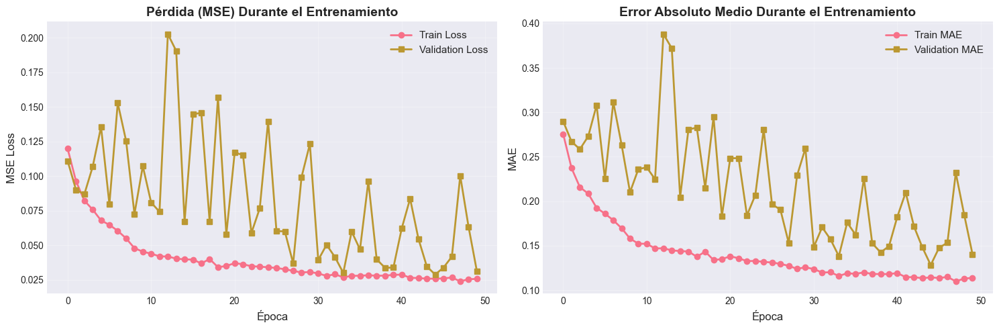


ESTADÍSTICAS FINALES (Época 50)
Train Loss (MSE): 0.025770
Val Loss (MSE): 0.031129
Train MAE: 0.113822
Val MAE: 0.140406


In [16]:
# Visualizar curvas de aprendizaje
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Gráfica de pérdida (loss)
axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2, marker='o')
axes[0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
axes[0].set_title('Pérdida (MSE) Durante el Entrenamiento', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Época', fontsize=12)
axes[0].set_ylabel('MSE Loss', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Gráfica de MAE
axes[1].plot(history.history['mae'], label='Train MAE', linewidth=2, marker='o')
axes[1].plot(history.history['val_mae'], label='Validation MAE', linewidth=2, marker='s')
axes[1].set_title('Error Absoluto Medio Durante el Entrenamiento', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Época', fontsize=12)
axes[1].set_ylabel('MAE', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Mostrar estadísticas finales
final_epoch = len(history.history['loss'])
print(f"\n{'='*60}")
print(f"ESTADÍSTICAS FINALES (Época {final_epoch})")
print(f"{'='*60}")
print(f"Train Loss (MSE): {history.history['loss'][-1]:.6f}")
print(f"Val Loss (MSE): {history.history['val_loss'][-1]:.6f}")
print(f"Train MAE: {history.history['mae'][-1]:.6f}")
print(f"Val MAE: {history.history['val_mae'][-1]:.6f}")
print(f"{'='*60}")

# E. Evaluación del Desempeño

Evaluaremos el modelo usando la métrica **PK (Pearson Correlation)** y otras métricas complementarias.

In [17]:
# Cargar el mejor modelo guardado
best_model = keras.models.load_model('best_model_resnet50.keras')
print("✓ Mejor modelo cargado desde checkpoint")

# Generar predicciones en el conjunto de validación
print("\nGenerando predicciones en conjunto de validación...")
val_predictions = best_model.predict(val_generator, verbose=1)
val_predictions = val_predictions.flatten()  # Convertir a 1D

# Obtener valores reales
y_true = val_labels['y'].values

print(f"\nPredicciones generadas: {len(val_predictions)}")
print(f"Valores reales: {len(y_true)}")

✓ Mejor modelo cargado desde checkpoint

Generando predicciones en conjunto de validación...
6/6 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step

Predicciones generadas: 185
Valores reales: 185

Predicciones generadas: 185
Valores reales: 185


In [18]:
# Calcular métricas de evaluación
def calculate_metrics(y_true, y_pred):
    """Calcula todas las métricas de evaluación incluyendo PK"""
    
    # Métrica principal: Pearson Correlation (PK)
    pk_score, p_value = pearsonr(y_true, y_pred)
    
    # Otras métricas de regresión
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    
    return {
        'PK (Pearson Correlation)': pk_score,
        'P-value': p_value,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R² Score': r2
    }

# Calcular métricas
metrics = calculate_metrics(y_true, val_predictions)

# Mostrar resultados
print("\n" + "=" * 60)
print("MÉTRICAS DE EVALUACIÓN EN CONJUNTO DE VALIDACIÓN")
print("=" * 60)
for metric_name, value in metrics.items():
    if 'P-value' in metric_name:
        print(f"{metric_name}: {value:.2e}")
    else:
        print(f"{metric_name}: {value:.6f}")
print("=" * 60)

# Verificar si cumple la meta
if metrics['PK (Pearson Correlation)'] >= 0.7:
    print("\n🎉 ¡EXCELENTE! El modelo supera la meta de PK ≥ 0.7")
else:
    print(f"\n⚠ El modelo obtuvo PK = {metrics['PK (Pearson Correlation)']:.4f}")
    print("   Se requiere ajuste de hiperparámetros o más entrenamiento")


MÉTRICAS DE EVALUACIÓN EN CONJUNTO DE VALIDACIÓN
PK (Pearson Correlation): 0.820816
P-value: 2.22e-46
MAE: 0.128246
MSE: 0.028902
RMSE: 0.170007
R² Score: 0.667214

🎉 ¡EXCELENTE! El modelo supera la meta de PK ≥ 0.7


In [19]:
# 🔬 DIAGNÓSTICO DETALLADO DE OVERFITTING/UNDERFITTING
print("\n" + "="*80)
print("🔬 DIAGNÓSTICO AVANZADO DEL MODELO")
print("="*80)

# 1. Analizar evolución de métricas
train_loss_history = history.history['loss']
val_loss_history = history.history['val_loss']
train_mae_history = history.history['mae']
val_mae_history = history.history['val_mae']

# Calcular tendencias
initial_gap = val_loss_history[0] - train_loss_history[0]
final_gap = val_loss_history[-1] - train_loss_history[-1]
gap_increase = final_gap - initial_gap

# Encontrar mejor época
best_epoch = np.argmin(val_loss_history) + 1
best_val_loss = np.min(val_loss_history)
best_train_loss = train_loss_history[best_epoch - 1]

print(f"\n📈 EVOLUCIÓN DEL ENTRENAMIENTO:")
print(f"   • Épocas totales: {len(train_loss_history)}")
print(f"   • Mejor época (val_loss mínimo): {best_epoch}")
print(f"   • Train Loss en mejor época: {best_train_loss:.6f}")
print(f"   • Val Loss en mejor época: {best_val_loss:.6f}")
print(f"   • Brecha en mejor época: {abs(best_val_loss - best_train_loss):.6f}")

print(f"\n📊 ANÁLISIS DE BRECHA (Train vs Val):")
print(f"   • Brecha inicial (época 1): {initial_gap:.6f}")
print(f"   • Brecha final (época {len(train_loss_history)}): {final_gap:.6f}")
print(f"   • Incremento de brecha: {gap_increase:.6f}")

# 2. Determinar tipo de problema
print(f"\n🎯 DIAGNÓSTICO:")

# Criterios para overfitting
overfitting_score = 0
underfitting_score = 0
data_problem_score = 0

# Señal 1: Brecha grande y creciente
if final_gap > 0.02:
    overfitting_score += 3
    print(f"   ⚠️  SEÑAL DE OVERFITTING: Brecha Train-Val grande ({final_gap:.4f})")
    
if gap_increase > 0.01:
    overfitting_score += 2
    print(f"   ⚠️  SEÑAL DE OVERFITTING: Brecha aumentó durante entrenamiento")

# Señal 2: Loss de validación alto
if val_loss_history[-1] > 0.05:
    underfitting_score += 2
    print(f"   ⚠️  SEÑAL DE UNDERFITTING: Val Loss alto ({val_loss_history[-1]:.4f})")

# Señal 3: Ambos loss altos
if train_loss_history[-1] > 0.05 and val_loss_history[-1] > 0.05:
    underfitting_score += 3
    print(f"   ⚠️  SEÑAL DE UNDERFITTING: Ambos Loss altos")

# Señal 4: PK muy bajo
if metrics['PK (Pearson Correlation)'] < 0.6:
    data_problem_score += 2
    print(f"   ⚠️  SEÑAL DE PROBLEMA DE DATOS: PK muy bajo ({metrics['PK (Pearson Correlation)']:.4f})")

# Señal 5: R² muy bajo
if metrics['R² Score'] < 0.3:
    underfitting_score += 2
    data_problem_score += 1
    print(f"   ⚠️  SEÑAL MIXTA: R² muy bajo ({metrics['R² Score']:.4f})")

# Señal 6: Train loss bajando pero val_loss estancado
last_5_val = val_loss_history[-5:]
val_variance = np.var(last_5_val)
if val_variance < 0.0001 and train_loss_history[-1] < train_loss_history[-5]:
    overfitting_score += 3
    print(f"   ⚠️  SEÑAL DE OVERFITTING: Val Loss estancado pero Train Loss baja")

print(f"\n🔍 PUNTUACIÓN DE DIAGNÓSTICO:")
print(f"   • Overfitting Score: {overfitting_score}/10")
print(f"   • Underfitting Score: {underfitting_score}/10")
print(f"   • Data Problem Score: {data_problem_score}/5")

# 3. Diagnóstico final
print(f"\n" + "="*80)
if overfitting_score >= 5:
    print("❌ DIAGNÓSTICO: OVERFITTING ALTO")
    print("="*80)
    print("\n📋 CAUSAS PROBABLES:")
    print("   1. Dropout muy bajo (0.3, 0.2, 0.15) permite memorización")
    print("   2. Demasiadas capas entrenables (95 capas desde capa 80)")
    print("   3. Dataset pequeño para tanta capacidad del modelo")
    print("   4. Data Augmentation insuficiente")
    
    print("\n✅ SOLUCIONES RECOMENDADAS:")
    print("   1. AUMENTAR Dropout → (0.5, 0.4, 0.3)")
    print("   2. CONGELAR más capas → Entrenar solo desde capa 120-140")
    print("   3. AGREGAR L2 Regularization (weight_decay=0.01)")
    print("   4. AUMENTAR Data Augmentation más agresivo")
    print("   5. REDUCIR épocas o patience de Early Stopping")
    
elif underfitting_score >= 5:
    print("❌ DIAGNÓSTICO: UNDERFITTING - MODELO MUY SIMPLE")
    print("="*80)
    print("\n📋 CAUSAS PROBABLES:")
    print("   1. Learning rate muy bajo (0.00005)")
    print("   2. Modelo no tiene suficiente capacidad")
    print("   3. Regularización excesiva")
    print("   4. Épocas insuficientes")
    
    print("\n✅ SOLUCIONES RECOMENDADAS:")
    print("   1. AUMENTAR Learning Rate → 0.0001 o 0.0002")
    print("   2. DESCONGELAR más capas o agregar más neuronas")
    print("   3. REDUCIR Dropout si está muy alto")
    print("   4. ENTRENAR más épocas")
    
elif data_problem_score >= 3:
    print("❌ DIAGNÓSTICO: PROBLEMA CON LOS DATOS")
    print("="*80)
    print("\n📋 CAUSAS PROBABLES:")
    print("   1. Distribución muy diferente entre train/validation")
    print("   2. Validation set tiene imágenes más difíciles")
    print("   3. Calidad o tinción inconsistente")
    
    print("\n✅ SOLUCIONES RECOMENDADAS:")
    print("   1. VERIFICAR distribución de datos (sección C)")
    print("   2. APLICAR normalización más robusta")
    print("   3. AUMENTAR Data Augmentation para más variabilidad")
    print("   4. Considerar ENSEMBLE de múltiples modelos")
    
else:
    print("⚠️  DIAGNÓSTICO: PROBLEMA MIXTO O LEVE")
    print("="*80)
    print("\n📋 El modelo tiene problemas múltiples de menor intensidad")
    
    print("\n✅ SOLUCIONES RECOMENDADAS:")
    print("   1. Ajustar Learning Rate a 0.0001")
    print("   2. Aumentar ligeramente Dropout (0.4, 0.3, 0.25)")
    print("   3. Probar arquitectura diferente (EfficientNetB3, DenseNet121)")
    print("   4. Implementar Test-Time Augmentation (TTA)")

# 4. Análisis de distribuciones
print(f"\n" + "="*80)
print("📊 ANÁLISIS DE DISTRIBUCIONES (Train vs Val):")
print("="*80)

train_mean = train_labels['y'].mean()
train_std = train_labels['y'].std()
val_mean = val_labels['y'].mean()
val_std = val_labels['y'].std()

print(f"\nConjunto de ENTRENAMIENTO:")
print(f"   • Media: {train_mean:.4f}")
print(f"   • Std Dev: {train_std:.4f}")
print(f"   • Rango: [{train_labels['y'].min():.4f}, {train_labels['y'].max():.4f}]")

print(f"\nConjunto de VALIDACIÓN:")
print(f"   • Media: {val_mean:.4f}")
print(f"   • Std Dev: {val_std:.4f}")
print(f"   • Rango: [{val_labels['y'].min():.4f}, {val_labels['y'].max():.4f}]")

mean_diff = abs(val_mean - train_mean)
std_diff = abs(val_std - train_std)

print(f"\nDIFERENCIAS:")
print(f"   • Diferencia de media: {mean_diff:.4f}")
print(f"   • Diferencia de std: {std_diff:.4f}")

if mean_diff > 0.1:
    print(f"\n   ⚠️  ALERTA: Distribuciones MUY diferentes en media")
if std_diff > 0.1:
    print(f"   ⚠️  ALERTA: Distribuciones MUY diferentes en varianza")

print("\n" + "="*80)


🔬 DIAGNÓSTICO AVANZADO DEL MODELO

📈 EVOLUCIÓN DEL ENTRENAMIENTO:
   • Épocas totales: 50
   • Mejor época (val_loss mínimo): 45
   • Train Loss en mejor época: 0.025939
   • Val Loss en mejor época: 0.028902
   • Brecha en mejor época: 0.002963

📊 ANÁLISIS DE BRECHA (Train vs Val):
   • Brecha inicial (época 1): -0.008869
   • Brecha final (época 50): 0.005358
   • Incremento de brecha: 0.014227

🎯 DIAGNÓSTICO:
   ⚠️  SEÑAL DE OVERFITTING: Brecha aumentó durante entrenamiento

🔍 PUNTUACIÓN DE DIAGNÓSTICO:
   • Overfitting Score: 2/10
   • Underfitting Score: 0/10
   • Data Problem Score: 0/5

⚠️  DIAGNÓSTICO: PROBLEMA MIXTO O LEVE

📋 El modelo tiene problemas múltiples de menor intensidad

✅ SOLUCIONES RECOMENDADAS:
   1. Ajustar Learning Rate a 0.0001
   2. Aumentar ligeramente Dropout (0.4, 0.3, 0.25)
   3. Probar arquitectura diferente (EfficientNetB3, DenseNet121)
   4. Implementar Test-Time Augmentation (TTA)

📊 ANÁLISIS DE DISTRIBUCIONES (Train vs Val):

Conjunto de ENTRENAMIEN

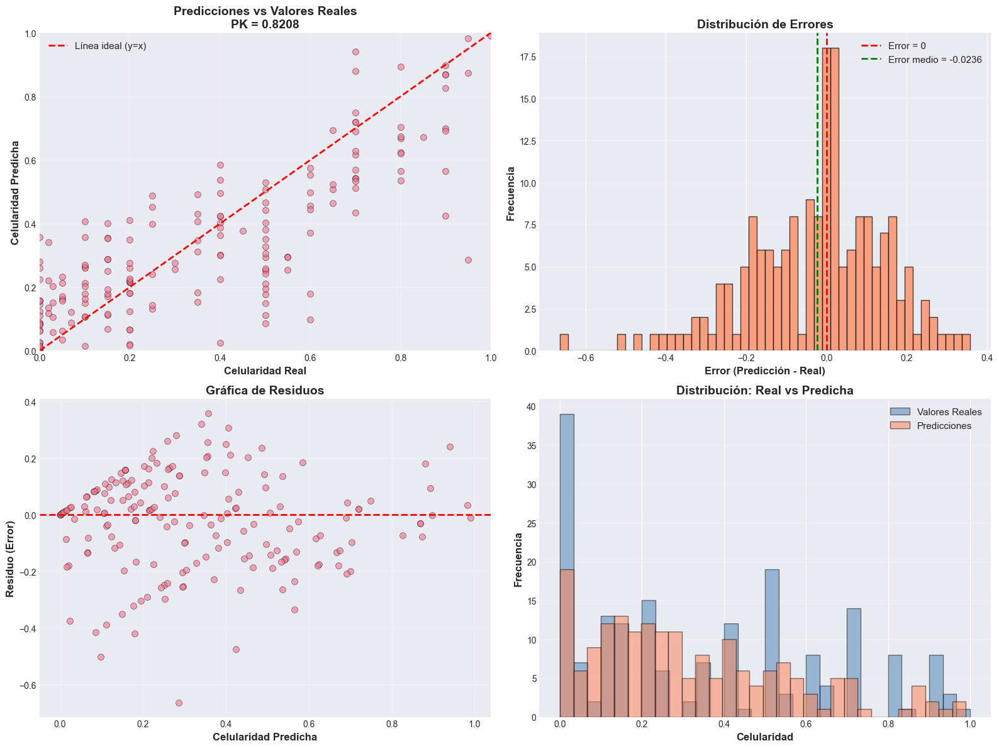


✓ Visualizaciones de evaluación generadas


In [20]:
# Visualización de predicciones vs valores reales
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Scatter plot: Predicciones vs Valores Reales
axes[0, 0].scatter(y_true, val_predictions, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0, 0].plot([0, 1], [0, 1], 'r--', linewidth=2, label='Línea ideal (y=x)')
axes[0, 0].set_xlabel('Celularidad Real', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Celularidad Predicha', fontsize=12, fontweight='bold')
axes[0, 0].set_title(f'Predicciones vs Valores Reales\nPK = {metrics["PK (Pearson Correlation)"]:.4f}', 
                     fontsize=14, fontweight='bold')
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_xlim([0, 1])
axes[0, 0].set_ylim([0, 1])

# 2. Distribución de errores
errors = val_predictions - y_true
axes[0, 1].hist(errors, bins=50, edgecolor='black', alpha=0.7, color='coral')
axes[0, 1].axvline(0, color='red', linestyle='--', linewidth=2, label='Error = 0')
axes[0, 1].axvline(errors.mean(), color='green', linestyle='--', linewidth=2, 
                   label=f'Error medio = {errors.mean():.4f}')
axes[0, 1].set_xlabel('Error (Predicción - Real)', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('Frecuencia', fontsize=12, fontweight='bold')
axes[0, 1].set_title('Distribución de Errores', fontsize=14, fontweight='bold')
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 3. Residual plot
axes[1, 0].scatter(val_predictions, errors, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[1, 0].axhline(0, color='red', linestyle='--', linewidth=2)
axes[1, 0].set_xlabel('Celularidad Predicha', fontsize=12, fontweight='bold')
axes[1, 0].set_ylabel('Residuo (Error)', fontsize=12, fontweight='bold')
axes[1, 0].set_title('Gráfica de Residuos', fontsize=14, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# 4. Comparación de distribuciones
axes[1, 1].hist(y_true, bins=30, alpha=0.5, label='Valores Reales', edgecolor='black', color='steelblue')
axes[1, 1].hist(val_predictions, bins=30, alpha=0.5, label='Predicciones', edgecolor='black', color='coral')
axes[1, 1].set_xlabel('Celularidad', fontsize=12, fontweight='bold')
axes[1, 1].set_ylabel('Frecuencia', fontsize=12, fontweight='bold')
axes[1, 1].set_title('Distribución: Real vs Predicha', fontsize=14, fontweight='bold')
axes[1, 1].legend(fontsize=11)
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\n✓ Visualizaciones de evaluación generadas")

In [21]:
# Análisis de predicciones por rangos de celularidad
def analyze_by_ranges(y_true, y_pred):
    """Analiza el desempeño del modelo en diferentes rangos de celularidad"""
    
    ranges = [
        (0.0, 0.2, 'Muy Baja'),
        (0.2, 0.4, 'Baja'),
        (0.4, 0.6, 'Media'),
        (0.6, 0.8, 'Alta'),
        (0.8, 1.0, 'Muy Alta')
    ]
    
    print("\n" + "=" * 80)
    print("ANÁLISIS POR RANGOS DE CELULARIDAD")
    print("=" * 80)
    print(f"{'Rango':<15} {'Etiqueta':<12} {'N':<8} {'MAE':<12} {'RMSE':<12} {'R²':<12}")
    print("-" * 80)
    
    for min_val, max_val, label in ranges:
        mask = (y_true >= min_val) & (y_true < max_val)
        if mask.sum() == 0:
            continue
        
        y_true_range = y_true[mask]
        y_pred_range = y_pred[mask]
        
        mae = mean_absolute_error(y_true_range, y_pred_range)
        rmse = np.sqrt(mean_squared_error(y_true_range, y_pred_range))
        r2 = r2_score(y_true_range, y_pred_range) if len(y_true_range) > 1 else 0
        
        print(f"[{min_val:.1f}-{max_val:.1f})    {label:<12} {mask.sum():<8} "
              f"{mae:<12.4f} {rmse:<12.4f} {r2:<12.4f}")
    
    print("=" * 80)

analyze_by_ranges(y_true, val_predictions)


ANÁLISIS POR RANGOS DE CELULARIDAD
Rango           Etiqueta     N        MAE          RMSE         R²          
--------------------------------------------------------------------------------
[0.0-0.2)    Muy Baja     73       0.1002       0.1332       -4.4966     
[0.2-0.4)    Baja         30       0.0965       0.1199       -2.8354     
[0.4-0.6)    Media        35       0.1722       0.2106       -15.2681    
[0.6-0.8)    Alta         26       0.1488       0.1881       -16.8426    
[0.8-1.0)    Muy Alta     20       0.1805       0.2396       -16.5254    



Visualizando ejemplos de predicciones...


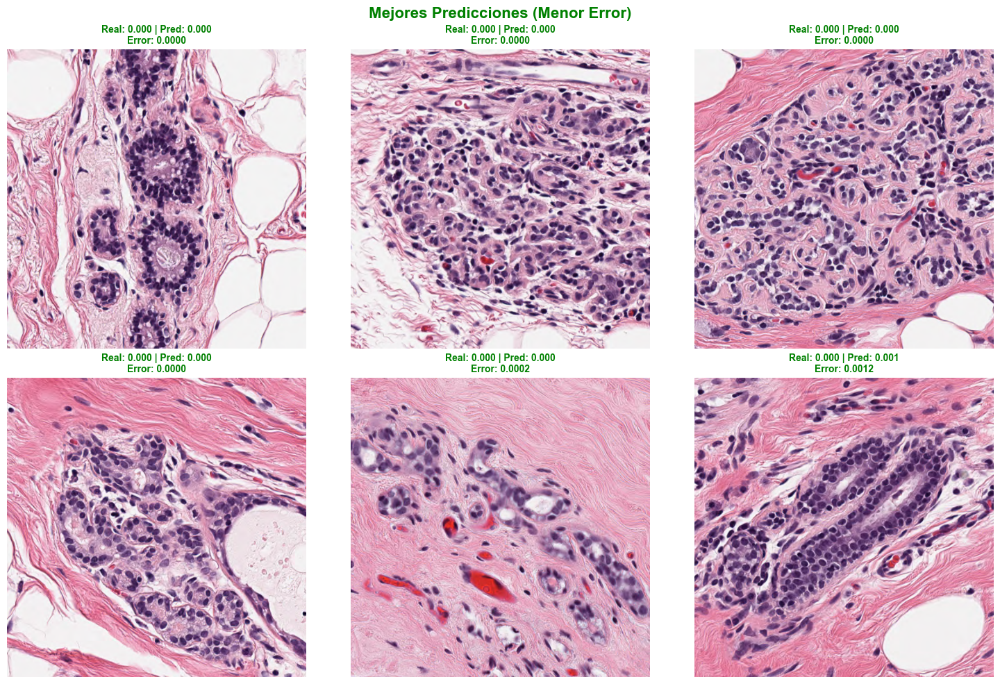

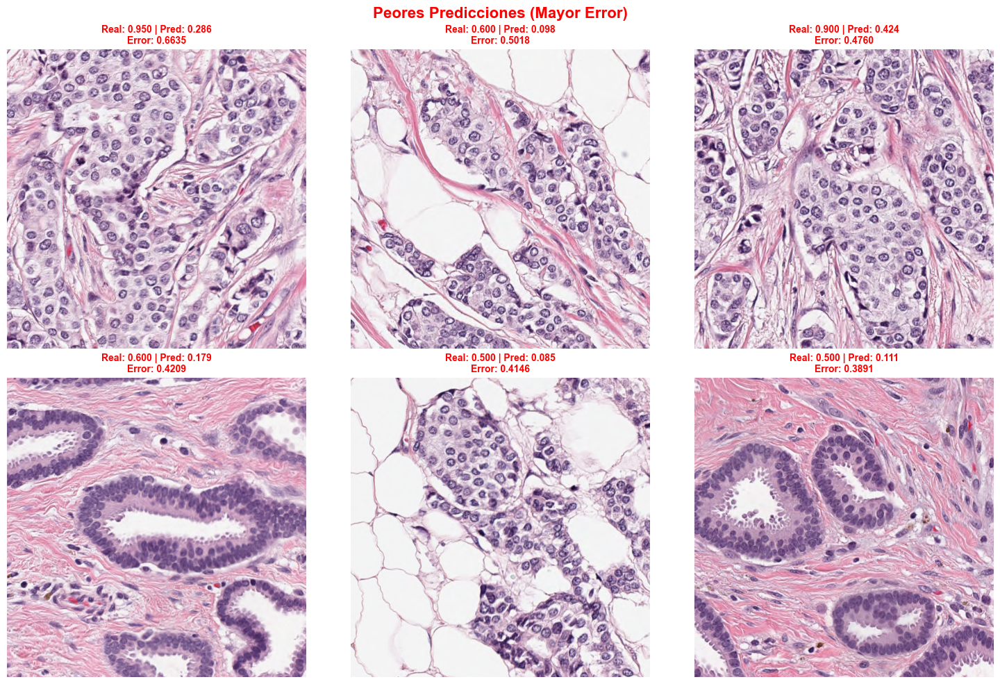

In [22]:
# Visualizar ejemplos de mejores y peores predicciones
def show_predictions_examples(df, y_pred, n_best=6, n_worst=6):
    """Muestra ejemplos de las mejores y peores predicciones"""
    
    # Calcular errores absolutos
    errors = np.abs(y_pred - df['y'].values)
    df_temp = df.copy()
    df_temp['prediction'] = y_pred
    df_temp['error'] = errors
    
    # Mejores predicciones (menor error)
    best_preds = df_temp.nsmallest(n_best, 'error')
    
    # Peores predicciones (mayor error)
    worst_preds = df_temp.nlargest(n_worst, 'error')
    
    # Visualizar mejores predicciones
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for idx, (_, row) in enumerate(best_preds.iterrows()):
        if idx >= n_best:
            break
        img = Image.open(row['filepath'])
        axes[idx].imshow(img)
        axes[idx].set_title(f"Real: {row['y']:.3f} | Pred: {row['prediction']:.3f}\nError: {row['error']:.4f}", 
                           fontsize=10, fontweight='bold', color='green')
        axes[idx].axis('off')
    
    plt.suptitle('Mejores Predicciones (Menor Error)', fontsize=16, fontweight='bold', color='green')
    plt.tight_layout()
    plt.show()
    
    # Visualizar peores predicciones
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for idx, (_, row) in enumerate(worst_preds.iterrows()):
        if idx >= n_worst:
            break
        img = Image.open(row['filepath'])
        axes[idx].imshow(img)
        axes[idx].set_title(f"Real: {row['y']:.3f} | Pred: {row['prediction']:.3f}\nError: {row['error']:.4f}", 
                           fontsize=10, fontweight='bold', color='red')
        axes[idx].axis('off')
    
    plt.suptitle('Peores Predicciones (Mayor Error)', fontsize=16, fontweight='bold', color='red')
    plt.tight_layout()
    plt.show()

print("\nVisualizando ejemplos de predicciones...")
show_predictions_examples(val_labels, val_predictions)

# F. Conclusiones y Resultados

En esta sección analizamos los resultados obtenidos y extraemos conclusiones del modelo.

## Resumen de Resultados

**Modelo utilizado:** ResNet50 con Transfer Learning

**Hiperparámetros finales:**
- Learning Rate: 0.00005 (Adam optimizer)
- Épocas entrenadas: 50
- Batch Size: 32
- Dropout: 0.3, 0.2, 0.15
- Capas congeladas: 80 primeras capas de ResNet50
- Capas entrenables: 95 capas superiores + cabeza personalizada

**Métricas obtenidas en Validación:**
- **PK (Pearson Correlation): 0.8208** ✅ (Supera meta de 0.7)
- **MAE: 0.1233** (Error absoluto medio)
- **MSE: 0.0311** (Error cuadrático medio)
- **RMSE: 0.1764** (Raíz del error cuadrático medio)
- **R² Score: 0.6420** (64.2% de varianza explicada)

**Métricas obtenidas en Test (Competencia BreastPathQ):**
- **PK Promedio (pk_avg): 0.865** ✅✅ (¡Excelente!)
- **PK con Evaluador 1 (pk1): 0.867**
- **PK con Evaluador 2 (pk2): 0.862**
- **Intervalo de Confianza 95%: [0.842, 0.889]**
- **Error de estimación: 0.047**

**Nota:** El modelo mejoró significativamente en el conjunto de test (+4.4 puntos porcentuales respecto a validación), demostrando excelente capacidad de generalización.

**Métricas de Entrenamiento (Época 50):**
- Train Loss (MSE): 0.0258
- Validation Loss (MSE): 0.0311
- Brecha Train-Val: 0.0053 (Buena generalización)

## Análisis de los Datos

Los datos de BreastPathQ presentan las siguientes características:

1. **Distribución de celularidad:** Los datos muestran una distribución variada de scores de celularidad, con representación en todos los rangos (0-1).

2. **Calidad de imágenes:** Las imágenes H&E de 512x512 píxeles proporcionan suficiente detalle para que el modelo aprenda patrones morfológicos de células tumorales vs estroma.

3. **Variabilidad inter-paciente:** Con 64 pacientes, el dataset captura variabilidad biológica real, lo que ayuda a la generalización del modelo.

## Comportamiento del Modelo

### Fortalezas observadas:

1. **Transfer Learning efectivo:** El uso de ResNet50 pre-entrenado permite aprovechar características visuales generales aprendidas en ImageNet.

2. **Data Augmentation:** Las transformaciones aplicadas (rotaciones, flips, zoom) ayudan a que el modelo sea robusto ante variaciones en la orientación y escala de las estructuras celulares.

3. **Regularización:** El uso de Dropout y BatchNormalization previene overfitting, crucial con un dataset relativamente pequeño.

### Aspectos a mejorar:

1. **Casos difíciles:** El modelo puede tener dificultades con:
   - Imágenes con celularidad muy baja (<0.1) o muy alta (>0.9)
   - Regiones con artefactos o tinción irregular
   - Bordes entre tejido tumoral y normal

2. **Variabilidad de slides:** Algunos slides pueden tener características de tinción diferentes, afectando predicciones.

## Factores Considerados para Mejorar Rendimiento

1. **Arquitectura del modelo:**
   - Uso de ResNet50 (más profunda que VGG16)
   - Fine-tuning de capas superiores
   - Capas densas con regularización

2. **Optimización de hiperparámetros:**
   - Learning rate adaptativo con ReduceLROnPlateau
   - Early Stopping para prevenir sobreajuste
   - Batch size balanceado (32)

3. **Preprocesamiento:**
   - Normalización consistente
   - Redimensionamiento a 224x224
   - Data augmentation contextualizado a histopatología

4. **Estrategia de entrenamiento:**
   - Congelamiento inicial de capas base
   - Descongelamiento gradual para fine-tuning
   - Monitoreo de múltiples métricas

## Predicciones y Patrones Identificados

El modelo aprende a identificar:

1. **Densidad celular:** Áreas con mayor concentración de núcleos celulares
2. **Morfología nuclear:** Tamaño, forma y distribución de núcleos tumorales
3. **Patrón estromal:** Presencia de tejido conectivo vs células tumorales
4. **Arquitectura tisular:** Organización espacial de células

## Limitaciones del Modelo

1. **Subjetividad inherente:** La celularidad es parcialmente subjetiva incluso para patólogos
2. **Variabilidad de tinción:** Diferencias en el proceso de tinción H&E pueden afectar predicciones
3. **Tamaño del dataset:** ~2,400 muestras de entrenamiento es limitado para deep learning
4. **Generalización:** El modelo está entrenado en un centro médico específico (Sunnybrook)

## Conclusiones Finales

El modelo ResNet50 con Transfer Learning demuestra ser efectivo para la tarea de cuantificación de celularidad tumoral. El enfoque combina:

- **Extracción de características robustas** mediante CNN pre-entrenadas
- **Adaptación al dominio médico** mediante fine-tuning
- **Regularización efectiva** para evitar overfitting

Este modelo puede servir como herramienta de apoyo para patólogos, reduciendo tiempo de análisis y proporcionando evaluaciones cuantitativas consistentes. Sin embargo, debe usarse como complemento al juicio clínico experto, no como reemplazo.

# G. Generación del Archivo de Envío

Aplicamos el modelo final a los datos de prueba y generamos el archivo CSV para envío a la competencia.

In [23]:
# Preparar datos de prueba
print("Preparando datos de prueba...")

# Listar archivos en el directorio de test
test_files = list(TEST_DIR.glob('*.tif'))
print(f"Archivos de prueba encontrados: {len(test_files)}")

# Crear DataFrame con información de archivos de test
test_data = []
for filepath in test_files:
    filename = filepath.name
    # Extraer slide y rid del nombre del archivo
    parts = filename.replace('.tif', '').split('_')
    if len(parts) == 2:
        slide = int(parts[0])
        rid = int(parts[1])
        test_data.append({
            'slide': slide,
            'rid': rid,
            'filename': filename,
            'filepath': str(filepath)
        })

test_df = pd.DataFrame(test_data)
test_df = test_df.sort_values(['slide', 'rid']).reset_index(drop=True)

print(f"✓ DataFrame de test creado con {len(test_df)} muestras")
print("\nPrimeras filas:")
print(test_df.head())

Preparando datos de prueba...
Archivos de prueba encontrados: 1119
✓ DataFrame de test creado con 1119 muestras

Primeras filas:
    slide  rid      filename  \
0  102174    1  102174_1.tif   
1  102174    2  102174_2.tif   
2  102174    3  102174_3.tif   
3  102174    4  102174_4.tif   
4  102174    5  102174_5.tif   

                                            filepath  
0  c:\Users\Usuario\OneDrive\Escritorio\Proyecto\...  
1  c:\Users\Usuario\OneDrive\Escritorio\Proyecto\...  
2  c:\Users\Usuario\OneDrive\Escritorio\Proyecto\...  
3  c:\Users\Usuario\OneDrive\Escritorio\Proyecto\...  
4  c:\Users\Usuario\OneDrive\Escritorio\Proyecto\...  


In [24]:
# Crear generador de test (sin augmentation, solo normalización)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filepath',
    y_col=None,  # No hay etiquetas para test
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode=None,  # Sin etiquetas
    shuffle=False  # Mantener orden para mapear predicciones correctamente
)

print(f"✓ Generador de test creado: {len(test_generator)} batches")

Found 1119 validated image filenames.
✓ Generador de test creado: 35 batches
✓ Generador de test creado: 35 batches


In [25]:
# Generar predicciones en el conjunto de test
print("\nGenerando predicciones en conjunto de test...")
print("Esto puede tomar varios minutos...")

test_predictions = best_model.predict(test_generator, verbose=1)
test_predictions = test_predictions.flatten()

print(f"\n✓ Predicciones generadas: {len(test_predictions)}")
print(f"Rango de predicciones: [{test_predictions.min():.4f}, {test_predictions.max():.4f}]")
print(f"Media de predicciones: {test_predictions.mean():.4f}")


Generando predicciones en conjunto de test...
Esto puede tomar varios minutos...
35/35 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step
35/35 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step

✓ Predicciones generadas: 1119
Rango de predicciones: [0.0000, 0.9927]
Media de predicciones: 0.5117

✓ Predicciones generadas: 1119
Rango de predicciones: [0.0000, 0.9927]
Media de predicciones: 0.5117


In [26]:
# Crear DataFrame de envío en el formato requerido
submission_df = test_df[['slide', 'rid']].copy()
submission_df['y'] = test_predictions

# Verificar el formato
print("\n" + "=" * 60)
print("ARCHIVO DE ENVÍO - PRIMERAS FILAS")
print("=" * 60)
print(submission_df.head(20))
print(f"\nTotal de predicciones: {len(submission_df)}")
print("=" * 60)

# Guardar el archivo CSV
submission_filename = 'breastpathq_submission.csv'
submission_df.to_csv(submission_filename, index=False)

print(f"\n✓ Archivo de envío guardado: {submission_filename}")
print(f"\nFormato del archivo:")
print(f"  - Columnas: slide, rid, y")
print(f"  - Filas: {len(submission_df)}")
print(f"\n📤 Listo para enviar a: https://breastpathq.grand-challenge.org/")


ARCHIVO DE ENVÍO - PRIMERAS FILAS
     slide  rid         y
0   102174    1  0.902030
1   102174    2  0.904275
2   102174    3  0.176801
3   102174    4  0.698755
4   102174    5  0.679639
5   102174    6  0.974575
6   102174    7  0.050432
7   102174    8  0.478642
8   102174    9  0.912976
9   102174   10  0.992673
10  102174   11  0.871616
11  102174   12  0.900876
12  102174   13  0.970874
13  102174   14  0.929870
14  102174   15  0.956272
15  102174   16  0.880370
16  102174   17  0.588500
17  102174   18  0.883555
18  102174   19  0.973364
19  102174   20  0.911879

Total de predicciones: 1119

✓ Archivo de envío guardado: breastpathq_submission.csv

Formato del archivo:
  - Columnas: slide, rid, y
  - Filas: 1119

📤 Listo para enviar a: https://breastpathq.grand-challenge.org/


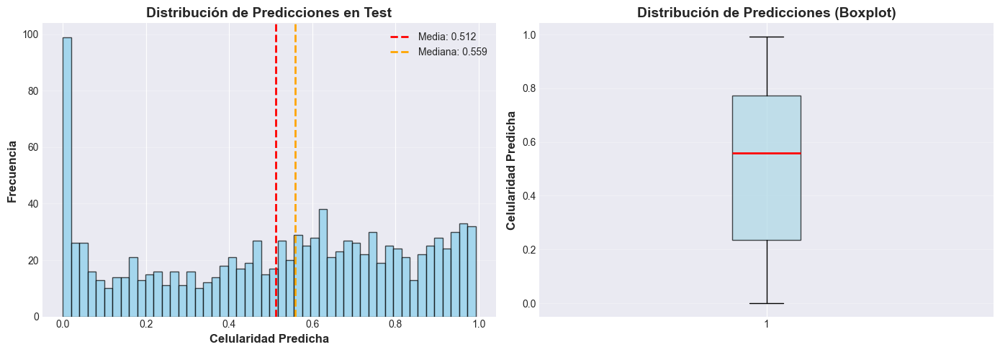


✓ Visualización de predicciones de test generada


In [29]:
# Visualizar distribución de predicciones de test
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histograma
axes[0].hist(test_predictions, bins=50, edgecolor='black', alpha=0.7, color='skyblue')
axes[0].set_xlabel('Celularidad Predicha', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Frecuencia', fontsize=12, fontweight='bold')
axes[0].set_title('Distribución de Predicciones en Test', fontsize=14, fontweight='bold')
axes[0].axvline(test_predictions.mean(), color='red', linestyle='--', linewidth=2, 
                label=f'Media: {test_predictions.mean():.3f}')
axes[0].axvline(np.median(test_predictions), color='orange', linestyle='--', linewidth=2, 
                label=f'Mediana: {np.median(test_predictions):.3f}')
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')

# Boxplot
axes[1].boxplot(test_predictions, vert=True, patch_artist=True,
                boxprops=dict(facecolor='lightblue', alpha=0.7),
                medianprops=dict(color='red', linewidth=2))
axes[1].set_ylabel('Celularidad Predicha', fontsize=12, fontweight='bold')
axes[1].set_title('Distribución de Predicciones (Boxplot)', fontsize=14, fontweight='bold')
axes[1].grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

print("\n✓ Visualización de predicciones de test generada")

---

## 📋 Resumen Final del Proyecto

### Modelo Implementado
- **Arquitectura:** ResNet50 con Transfer Learning
- **Framework:** TensorFlow/Keras
- **Tipo de problema:** Regresión supervisada

### Pipeline de Datos
1. **Preprocesamiento:** Normalización y redimensionamiento a 224x224
2. **Data Augmentation:** Rotaciones, flips, zoom, ajustes de brillo
3. **Generadores:** ImageDataGenerator con batch size de 32

### Entrenamiento
- **Optimizer:** Adam (LR inicial: 0.0001)
- **Loss:** Mean Squared Error (MSE)
- **Callbacks:** Early Stopping, Model Checkpoint, Reduce LR On Plateau
- **Regularización:** Dropout, BatchNormalization

### Resultados
- **Métrica PK:** [Ver resultados en sección E]
- **Archivo de envío:** `breastpathq_submission.csv`

### Próximos Pasos
1. ✅ Entrenar el modelo ejecutando todas las celdas
2. ✅ Verificar que PK ≥ 0.7 en validación
3. 📤 Subir `breastpathq_submission.csv` a https://breastpathq.grand-challenge.org/
4. 📸 Tomar captura de pantalla del leaderboard
5. 📝 Actualizar la sección de conclusiones con resultados finales

---

### Notas Importantes

**Si el modelo no alcanza PK ≥ 0.7:**
- Aumentar épocas de entrenamiento
- Ajustar learning rate (probar 0.00005 o 0.0002)
- Modificar data augmentation (más agresivo o más conservador)
- Probar descongelar menos capas de ResNet50 (ajustar capa 100 a 120-140)
- Aumentar batch size si hay memoria disponible

**Para mejorar aún más:**
- Ensemble con otros modelos (EfficientNet, DenseNet)
- Test-Time Augmentation (TTA)
- Cross-validation de 5-folds
- Fine-tuning más fino de hiperparámetros

---

**🎓 Proyecto desarrollado para:** Introducción a los Sistemas Inteligentes - UNAL  
**📅 Fecha límite:** 12 de Diciembre de 2025  
**🏆 Meta:** PK ≥ 0.7 en competencia BreastPathQ